# GANs For Art

## Importing the modules

In [52]:
import os
import pandas as pd
import torch
import torchvision
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook import tqdm
import torchvision.models as models
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torchvision.utils import make_grid
import torchvision.transforms as transforms
from torchvision.datasets.folder import default_loader
import matplotlib.pyplot as plt
%matplotlib inline

## Preparing the data

In [53]:
artists = pd.read_csv("/kaggle/input/artists/artists.csv")

for i in artists['name']:
    print(i,end=" | ")

Amedeo Modigliani | Vasiliy Kandinskiy | Diego Rivera | Claude Monet | Rene Magritte | Salvador Dali | Edouard Manet | Andrei Rublev | Vincent van Gogh | Gustav Klimt | Hieronymus Bosch | Kazimir Malevich | Mikhail Vrubel | Pablo Picasso | Peter Paul Rubens | Pierre-Auguste Renoir | Francisco Goya | Frida Kahlo | El Greco | Albrecht Dürer | Alfred Sisley | Pieter Bruegel | Marc Chagall | Giotto di Bondone | Sandro Botticelli | Caravaggio | Leonardo da Vinci | Diego Velazquez | Henri Matisse | Jan van Eyck | Edgar Degas | Rembrandt | Titian | Henri de Toulouse-Lautrec | Gustave Courbet | Camille Pissarro | William Turner | Edvard Munch | Paul Cezanne | Eugene Delacroix | Henri Rousseau | Georges Seurat | Paul Klee | Piet Mondrian | Joan Miro | Andy Warhol | Paul Gauguin | Raphael | Michelangelo | Jackson Pollock | 

In [54]:
batch_size = 128
image_size = (64,64)
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [55]:
transform_ds = transforms.Compose([transforms.Resize(image_size),
#                                    transforms.RandomCrop(32, padding=2),
#                                    transforms.RandomHorizontalFlip(),
                                   transforms.ToTensor(),
                                   transforms.Normalize(*stats)
                                   ])

train_ds = torchvision.datasets.ImageFolder(root="/kaggle/input/best-artworks-of-all-time",
                                     transform=transform_ds)

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)
print(len(train_ds))

1837


torch.Size([3, 64, 64])


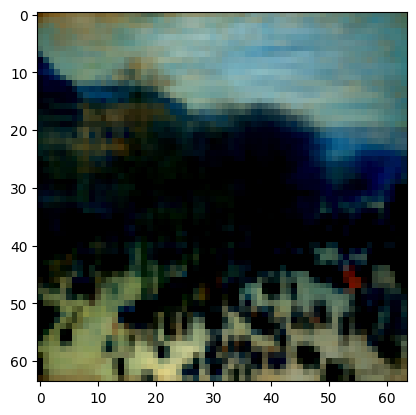

In [56]:
images,_ = train_ds[382]
print(images.size())
plt.imshow(images.permute(1,2,0))

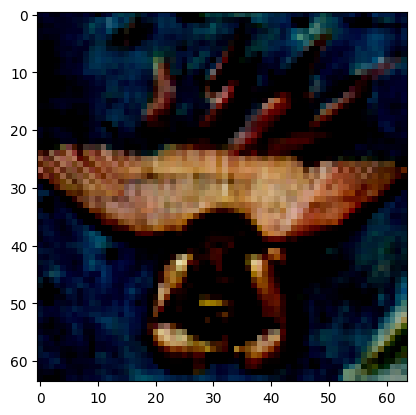

In [57]:
images,_ = train_ds[872]
plt.imshow(images.permute(1,2,0))

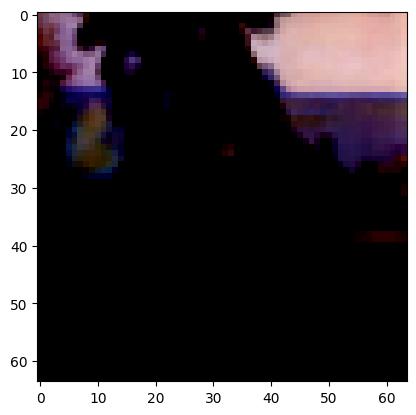

In [58]:
images,_ = train_ds[1822]
plt.imshow(images.permute(1,2,0))

In [59]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [60]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


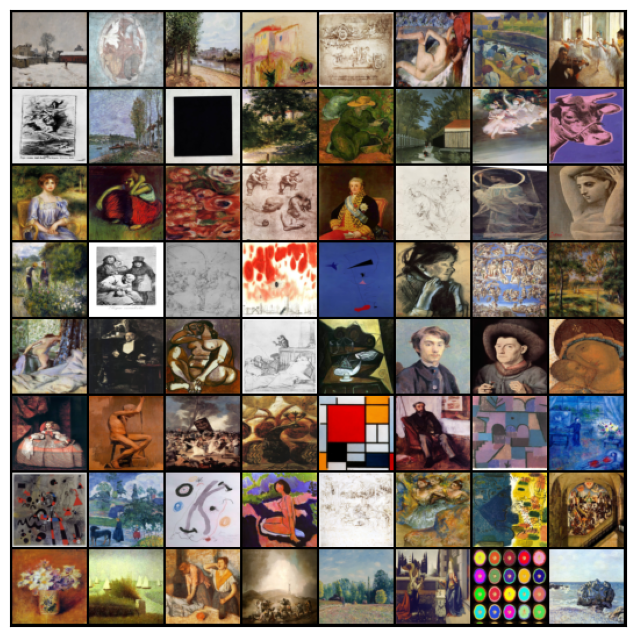

In [61]:
show_batch(train_dl)

In [62]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [63]:
device = get_default_device()
device

device(type='cpu')

In [64]:
train_dl = DeviceDataLoader(train_dl, device)

In [65]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [66]:
discriminator = to_device(discriminator, device)

In [67]:
latent_size = 150

In [68]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

## Defining the model

torch.Size([128, 3, 64, 64])


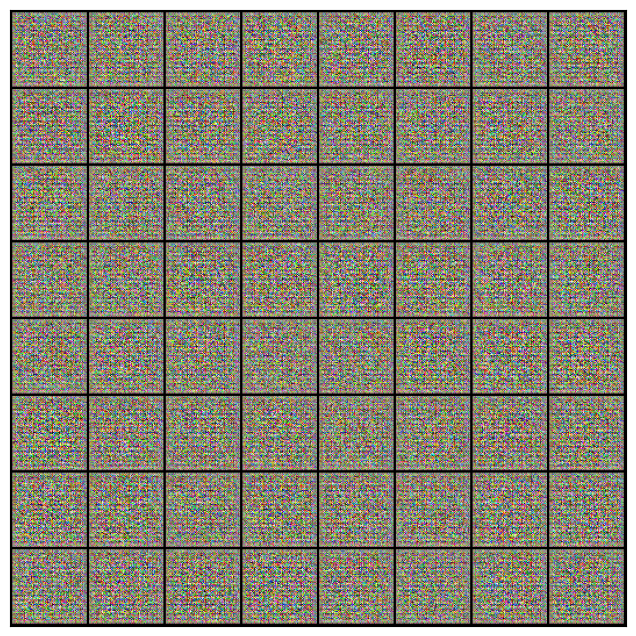

In [76]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [77]:
generator = to_device(generator, device)

In [78]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [79]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [80]:
from torchvision.utils import save_image

In [81]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [82]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [83]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


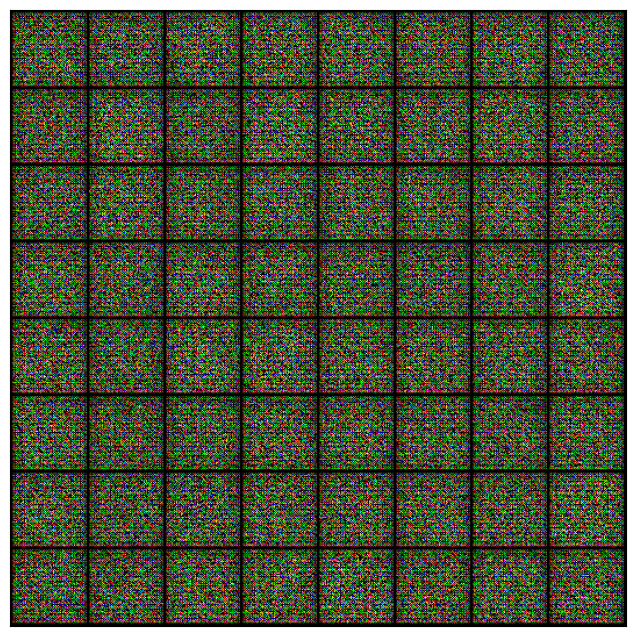

In [84]:
save_samples(0, fixed_latent)

In [85]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [86]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [87]:
lr = 0.001
epochs = 150

In [88]:
history = fit(epochs,lr)

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [1/150], loss_g: 6.2180, loss_d: 0.0171, real_score: 0.9850, fake_score: 0.0018
Saving generated-images-0001.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [2/150], loss_g: 3.9609, loss_d: 0.6557, real_score: 0.7268, fake_score: 0.2498
Saving generated-images-0002.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [3/150], loss_g: 3.4121, loss_d: 0.1430, real_score: 0.9412, fake_score: 0.0764
Saving generated-images-0003.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [4/150], loss_g: 4.8304, loss_d: 0.2961, real_score: 0.9554, fake_score: 0.2152
Saving generated-images-0004.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [5/150], loss_g: 0.6748, loss_d: 2.8536, real_score: 0.0760, fake_score: 0.0316
Saving generated-images-0005.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [6/150], loss_g: 6.8475, loss_d: 0.7271, real_score: 0.9521, fake_score: 0.4596
Saving generated-images-0006.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [7/150], loss_g: 3.6245, loss_d: 0.1663, real_score: 0.9673, fake_score: 0.1206
Saving generated-images-0007.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [8/150], loss_g: 5.5681, loss_d: 0.3532, real_score: 0.7960, fake_score: 0.0636
Saving generated-images-0008.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [9/150], loss_g: 1.8707, loss_d: 0.7248, real_score: 0.6485, fake_score: 0.2021
Saving generated-images-0009.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [10/150], loss_g: 1.7905, loss_d: 0.8963, real_score: 0.7415, fake_score: 0.4087
Saving generated-images-0010.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [11/150], loss_g: 0.4387, loss_d: 1.4472, real_score: 0.3734, fake_score: 0.2151
Saving generated-images-0011.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [12/150], loss_g: 1.2574, loss_d: 1.3190, real_score: 0.3513, fake_score: 0.1195
Saving generated-images-0012.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [13/150], loss_g: 2.7062, loss_d: 1.5326, real_score: 0.9066, fake_score: 0.7304
Saving generated-images-0013.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [14/150], loss_g: 2.0953, loss_d: 0.8455, real_score: 0.7191, fake_score: 0.3720
Saving generated-images-0014.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [15/150], loss_g: 1.5963, loss_d: 1.6285, real_score: 0.9674, fake_score: 0.7432
Saving generated-images-0015.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [16/150], loss_g: 1.4611, loss_d: 0.9400, real_score: 0.6319, fake_score: 0.3527
Saving generated-images-0016.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [17/150], loss_g: 2.1194, loss_d: 1.5473, real_score: 0.2839, fake_score: 0.0514
Saving generated-images-0017.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [18/150], loss_g: 3.8037, loss_d: 0.9565, real_score: 0.6833, fake_score: 0.3773
Saving generated-images-0018.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [19/150], loss_g: 2.2365, loss_d: 0.9208, real_score: 0.7055, fake_score: 0.4037
Saving generated-images-0019.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [20/150], loss_g: 1.6230, loss_d: 0.9815, real_score: 0.6660, fake_score: 0.3904
Saving generated-images-0020.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [21/150], loss_g: 1.9263, loss_d: 1.1078, real_score: 0.7764, fake_score: 0.5400
Saving generated-images-0021.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [22/150], loss_g: 1.8142, loss_d: 0.8307, real_score: 0.5718, fake_score: 0.1622
Saving generated-images-0022.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [23/150], loss_g: 2.1313, loss_d: 2.9488, real_score: 0.0756, fake_score: 0.0197
Saving generated-images-0023.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [24/150], loss_g: 3.2672, loss_d: 0.7107, real_score: 0.8818, fake_score: 0.4164
Saving generated-images-0024.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [25/150], loss_g: 1.6241, loss_d: 1.1357, real_score: 0.4320, fake_score: 0.1444
Saving generated-images-0025.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [26/150], loss_g: 3.8932, loss_d: 1.0110, real_score: 0.8365, fake_score: 0.5202
Saving generated-images-0026.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [27/150], loss_g: 1.3054, loss_d: 1.4335, real_score: 0.4174, fake_score: 0.2107
Saving generated-images-0027.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [28/150], loss_g: 2.8849, loss_d: 1.3627, real_score: 0.7483, fake_score: 0.6072
Saving generated-images-0028.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [29/150], loss_g: 2.5002, loss_d: 0.9843, real_score: 0.6854, fake_score: 0.4018
Saving generated-images-0029.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [30/150], loss_g: 1.1085, loss_d: 2.3851, real_score: 0.1264, fake_score: 0.0131
Saving generated-images-0030.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [31/150], loss_g: 2.6288, loss_d: 0.9342, real_score: 0.8381, fake_score: 0.4693
Saving generated-images-0031.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [32/150], loss_g: 3.2847, loss_d: 0.6289, real_score: 0.8311, fake_score: 0.3263
Saving generated-images-0032.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [33/150], loss_g: 1.7181, loss_d: 0.6385, real_score: 0.6919, fake_score: 0.1782
Saving generated-images-0033.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [34/150], loss_g: 4.2103, loss_d: 1.3737, real_score: 0.8994, fake_score: 0.6597
Saving generated-images-0034.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [35/150], loss_g: 6.4953, loss_d: 1.5889, real_score: 0.9523, fake_score: 0.7307
Saving generated-images-0035.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [36/150], loss_g: 2.2094, loss_d: 1.0237, real_score: 0.5636, fake_score: 0.2893
Saving generated-images-0036.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [37/150], loss_g: 3.0377, loss_d: 0.8380, real_score: 0.8006, fake_score: 0.3687
Saving generated-images-0037.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [38/150], loss_g: 3.5950, loss_d: 0.4498, real_score: 0.8547, fake_score: 0.2190
Saving generated-images-0038.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [39/150], loss_g: 1.1864, loss_d: 2.3997, real_score: 0.1806, fake_score: 0.0462
Saving generated-images-0039.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [40/150], loss_g: 3.7844, loss_d: 0.4801, real_score: 0.7433, fake_score: 0.0954
Saving generated-images-0040.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [41/150], loss_g: 4.7640, loss_d: 1.7827, real_score: 0.9673, fake_score: 0.7649
Saving generated-images-0041.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [42/150], loss_g: 4.9873, loss_d: 1.4293, real_score: 0.8698, fake_score: 0.6792
Saving generated-images-0042.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [43/150], loss_g: 3.7916, loss_d: 0.7802, real_score: 0.7949, fake_score: 0.3947
Saving generated-images-0043.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [44/150], loss_g: 2.5414, loss_d: 0.7438, real_score: 0.7394, fake_score: 0.3222
Saving generated-images-0044.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [45/150], loss_g: 3.0636, loss_d: 0.5636, real_score: 0.6667, fake_score: 0.0884
Saving generated-images-0045.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [46/150], loss_g: 2.0279, loss_d: 0.7806, real_score: 0.6285, fake_score: 0.2236
Saving generated-images-0046.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [47/150], loss_g: 2.8620, loss_d: 1.5650, real_score: 0.8854, fake_score: 0.7266
Saving generated-images-0047.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [48/150], loss_g: 3.9385, loss_d: 0.9879, real_score: 0.7842, fake_score: 0.4752
Saving generated-images-0048.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [49/150], loss_g: 3.0255, loss_d: 0.4242, real_score: 0.7361, fake_score: 0.0751
Saving generated-images-0049.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [50/150], loss_g: 4.1715, loss_d: 0.4338, real_score: 0.7422, fake_score: 0.0682
Saving generated-images-0050.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [51/150], loss_g: 4.8884, loss_d: 0.6129, real_score: 0.8971, fake_score: 0.3582
Saving generated-images-0051.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [52/150], loss_g: 8.0871, loss_d: 1.8807, real_score: 0.8845, fake_score: 0.7783
Saving generated-images-0052.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [53/150], loss_g: 3.0145, loss_d: 0.4893, real_score: 0.7090, fake_score: 0.0848
Saving generated-images-0053.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [54/150], loss_g: 6.8026, loss_d: 1.4097, real_score: 0.9513, fake_score: 0.6600
Saving generated-images-0054.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [55/150], loss_g: 3.2358, loss_d: 0.7585, real_score: 0.9024, fake_score: 0.4226
Saving generated-images-0055.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [56/150], loss_g: 4.0074, loss_d: 0.8308, real_score: 0.9065, fake_score: 0.4517
Saving generated-images-0056.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [57/150], loss_g: 4.5866, loss_d: 0.4426, real_score: 0.8303, fake_score: 0.1921
Saving generated-images-0057.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [58/150], loss_g: 3.2391, loss_d: 0.5914, real_score: 0.6717, fake_score: 0.1241
Saving generated-images-0058.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [59/150], loss_g: 3.4379, loss_d: 0.6463, real_score: 0.5877, fake_score: 0.0393
Saving generated-images-0059.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [60/150], loss_g: 1.3508, loss_d: 1.4744, real_score: 0.2970, fake_score: 0.0446
Saving generated-images-0060.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [61/150], loss_g: 3.2210, loss_d: 0.7432, real_score: 0.6341, fake_score: 0.1930
Saving generated-images-0061.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [62/150], loss_g: 0.9835, loss_d: 0.7047, real_score: 0.5962, fake_score: 0.0691
Saving generated-images-0062.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [63/150], loss_g: 3.5424, loss_d: 0.3664, real_score: 0.8726, fake_score: 0.1862
Saving generated-images-0063.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [64/150], loss_g: 3.4640, loss_d: 1.2691, real_score: 0.3443, fake_score: 0.0272
Saving generated-images-0064.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [65/150], loss_g: 4.0155, loss_d: 0.8989, real_score: 0.8359, fake_score: 0.4743
Saving generated-images-0065.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [66/150], loss_g: 2.2699, loss_d: 1.0736, real_score: 0.5649, fake_score: 0.2440
Saving generated-images-0066.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [67/150], loss_g: 3.8537, loss_d: 0.7128, real_score: 0.8514, fake_score: 0.3835
Saving generated-images-0067.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [68/150], loss_g: 4.3824, loss_d: 0.4969, real_score: 0.7662, fake_score: 0.1510
Saving generated-images-0068.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [69/150], loss_g: 4.1371, loss_d: 0.3532, real_score: 0.8939, fake_score: 0.1918
Saving generated-images-0069.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [70/150], loss_g: 4.7927, loss_d: 0.7125, real_score: 0.9083, fake_score: 0.3972
Saving generated-images-0070.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [71/150], loss_g: 6.6741, loss_d: 1.1142, real_score: 0.8422, fake_score: 0.4816
Saving generated-images-0071.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [72/150], loss_g: 3.7409, loss_d: 0.8152, real_score: 0.8818, fake_score: 0.4335
Saving generated-images-0072.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [73/150], loss_g: 2.8706, loss_d: 0.7103, real_score: 0.7098, fake_score: 0.2189
Saving generated-images-0073.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [74/150], loss_g: 4.1314, loss_d: 0.4375, real_score: 0.8938, fake_score: 0.2174
Saving generated-images-0074.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [75/150], loss_g: 4.8309, loss_d: 0.3348, real_score: 0.8013, fake_score: 0.0587
Saving generated-images-0075.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [76/150], loss_g: 3.4462, loss_d: 0.6602, real_score: 0.7985, fake_score: 0.2923
Saving generated-images-0076.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [77/150], loss_g: 6.1434, loss_d: 1.0104, real_score: 0.9579, fake_score: 0.5411
Saving generated-images-0077.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [78/150], loss_g: 2.4815, loss_d: 0.3583, real_score: 0.9097, fake_score: 0.2089
Saving generated-images-0078.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [79/150], loss_g: 3.3531, loss_d: 0.9803, real_score: 0.5159, fake_score: 0.0305
Saving generated-images-0079.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [80/150], loss_g: 4.3476, loss_d: 0.9384, real_score: 0.8553, fake_score: 0.4212
Saving generated-images-0080.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [81/150], loss_g: 3.3986, loss_d: 0.5895, real_score: 0.8640, fake_score: 0.3052
Saving generated-images-0081.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [82/150], loss_g: 3.8651, loss_d: 0.6576, real_score: 0.7824, fake_score: 0.2717
Saving generated-images-0082.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [83/150], loss_g: 4.5588, loss_d: 1.1577, real_score: 0.8116, fake_score: 0.4855
Saving generated-images-0083.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [84/150], loss_g: 3.3965, loss_d: 0.5821, real_score: 0.7353, fake_score: 0.1803
Saving generated-images-0084.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [85/150], loss_g: 4.1594, loss_d: 0.7173, real_score: 0.8800, fake_score: 0.3851
Saving generated-images-0085.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [86/150], loss_g: 2.5088, loss_d: 0.8079, real_score: 0.5998, fake_score: 0.1543
Saving generated-images-0086.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [87/150], loss_g: 3.4391, loss_d: 0.6221, real_score: 0.7430, fake_score: 0.2217
Saving generated-images-0087.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [88/150], loss_g: 1.9553, loss_d: 2.9476, real_score: 0.1087, fake_score: 0.0046
Saving generated-images-0088.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [89/150], loss_g: 3.1350, loss_d: 1.2172, real_score: 0.6135, fake_score: 0.3506
Saving generated-images-0089.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [90/150], loss_g: 2.3952, loss_d: 0.8529, real_score: 0.6352, fake_score: 0.1693
Saving generated-images-0090.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [91/150], loss_g: 4.3917, loss_d: 1.0560, real_score: 0.6535, fake_score: 0.3605
Saving generated-images-0091.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [92/150], loss_g: 4.8249, loss_d: 0.7780, real_score: 0.8522, fake_score: 0.3963
Saving generated-images-0092.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [93/150], loss_g: 2.9818, loss_d: 1.0853, real_score: 0.8250, fake_score: 0.4716
Saving generated-images-0093.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [94/150], loss_g: 3.4954, loss_d: 0.8421, real_score: 0.7163, fake_score: 0.2904
Saving generated-images-0094.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [95/150], loss_g: 4.7771, loss_d: 0.6560, real_score: 0.7813, fake_score: 0.2390
Saving generated-images-0095.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [96/150], loss_g: 3.2853, loss_d: 0.6670, real_score: 0.8392, fake_score: 0.3207
Saving generated-images-0096.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [97/150], loss_g: 4.6389, loss_d: 0.3899, real_score: 0.8994, fake_score: 0.1953
Saving generated-images-0097.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [98/150], loss_g: 3.4759, loss_d: 0.4343, real_score: 0.8138, fake_score: 0.1416
Saving generated-images-0098.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [99/150], loss_g: 2.7088, loss_d: 0.7221, real_score: 0.5973, fake_score: 0.0493
Saving generated-images-0099.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [100/150], loss_g: 3.4865, loss_d: 0.5836, real_score: 0.7349, fake_score: 0.1592
Saving generated-images-0100.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [101/150], loss_g: 3.3548, loss_d: 0.9064, real_score: 0.7792, fake_score: 0.3694
Saving generated-images-0101.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [102/150], loss_g: 2.7279, loss_d: 0.6195, real_score: 0.6928, fake_score: 0.1102
Saving generated-images-0102.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [103/150], loss_g: 3.2357, loss_d: 0.5277, real_score: 0.7563, fake_score: 0.1317
Saving generated-images-0103.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [104/150], loss_g: 6.0648, loss_d: 0.9763, real_score: 0.8713, fake_score: 0.4761
Saving generated-images-0104.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [105/150], loss_g: 3.9092, loss_d: 0.4122, real_score: 0.8655, fake_score: 0.1747
Saving generated-images-0105.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [106/150], loss_g: 1.3925, loss_d: 1.1353, real_score: 0.4958, fake_score: 0.1277
Saving generated-images-0106.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [107/150], loss_g: 2.8334, loss_d: 0.5591, real_score: 0.7042, fake_score: 0.1251
Saving generated-images-0107.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [108/150], loss_g: 5.7953, loss_d: 0.8505, real_score: 0.7939, fake_score: 0.3790
Saving generated-images-0108.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [109/150], loss_g: 7.1434, loss_d: 1.2010, real_score: 0.9047, fake_score: 0.4989
Saving generated-images-0109.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [110/150], loss_g: 4.7616, loss_d: 0.3477, real_score: 0.8497, fake_score: 0.1361
Saving generated-images-0110.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [111/150], loss_g: 4.8438, loss_d: 0.7581, real_score: 0.8343, fake_score: 0.3387
Saving generated-images-0111.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [112/150], loss_g: 5.5463, loss_d: 0.8338, real_score: 0.9296, fake_score: 0.4515
Saving generated-images-0112.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [113/150], loss_g: 4.3123, loss_d: 0.4543, real_score: 0.8405, fake_score: 0.1979
Saving generated-images-0113.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [114/150], loss_g: 3.0695, loss_d: 0.7794, real_score: 0.5910, fake_score: 0.0524
Saving generated-images-0114.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [115/150], loss_g: 2.7387, loss_d: 0.5972, real_score: 0.7680, fake_score: 0.1933
Saving generated-images-0115.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [116/150], loss_g: 3.6631, loss_d: 0.6545, real_score: 0.6204, fake_score: 0.0427
Saving generated-images-0116.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [117/150], loss_g: 4.3600, loss_d: 0.5070, real_score: 0.7978, fake_score: 0.1868
Saving generated-images-0117.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [118/150], loss_g: 4.1837, loss_d: 0.5344, real_score: 0.8000, fake_score: 0.2180
Saving generated-images-0118.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [119/150], loss_g: 4.5780, loss_d: 0.4391, real_score: 0.8679, fake_score: 0.2114
Saving generated-images-0119.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [120/150], loss_g: 4.6964, loss_d: 0.3456, real_score: 0.9204, fake_score: 0.1994
Saving generated-images-0120.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [121/150], loss_g: 5.0287, loss_d: 0.3118, real_score: 0.8562, fake_score: 0.1192
Saving generated-images-0121.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [122/150], loss_g: 5.7051, loss_d: 1.1501, real_score: 0.9776, fake_score: 0.5668
Saving generated-images-0122.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [123/150], loss_g: 3.9539, loss_d: 0.3797, real_score: 0.8851, fake_score: 0.1874
Saving generated-images-0123.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [124/150], loss_g: 3.3947, loss_d: 0.6706, real_score: 0.6726, fake_score: 0.1218
Saving generated-images-0124.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [125/150], loss_g: 5.4774, loss_d: 0.4845, real_score: 0.7225, fake_score: 0.0361
Saving generated-images-0125.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [126/150], loss_g: 2.6710, loss_d: 0.8115, real_score: 0.6580, fake_score: 0.1515
Saving generated-images-0126.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [127/150], loss_g: 5.2556, loss_d: 0.5007, real_score: 0.9017, fake_score: 0.2555
Saving generated-images-0127.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [128/150], loss_g: 2.5328, loss_d: 0.5040, real_score: 0.7274, fake_score: 0.0905
Saving generated-images-0128.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [129/150], loss_g: 7.8670, loss_d: 0.8579, real_score: 0.9396, fake_score: 0.4350
Saving generated-images-0129.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [130/150], loss_g: 5.0775, loss_d: 0.3021, real_score: 0.8940, fake_score: 0.1381
Saving generated-images-0130.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [131/150], loss_g: 5.4258, loss_d: 0.7147, real_score: 0.7735, fake_score: 0.2669
Saving generated-images-0131.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [132/150], loss_g: 3.5159, loss_d: 0.4252, real_score: 0.7566, fake_score: 0.0941
Saving generated-images-0132.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [133/150], loss_g: 7.4521, loss_d: 0.5710, real_score: 0.9315, fake_score: 0.3290
Saving generated-images-0133.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [134/150], loss_g: 3.5343, loss_d: 1.3212, real_score: 0.4509, fake_score: 0.0093
Saving generated-images-0134.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [135/150], loss_g: 3.7518, loss_d: 0.3559, real_score: 0.8297, fake_score: 0.1001
Saving generated-images-0135.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [136/150], loss_g: 5.0100, loss_d: 0.2178, real_score: 0.8975, fake_score: 0.0872
Saving generated-images-0136.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [137/150], loss_g: 4.1863, loss_d: 0.3399, real_score: 0.8768, fake_score: 0.1576
Saving generated-images-0137.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [138/150], loss_g: 6.6564, loss_d: 0.5280, real_score: 0.9588, fake_score: 0.3197
Saving generated-images-0138.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [139/150], loss_g: 5.0490, loss_d: 0.6705, real_score: 0.6243, fake_score: 0.0154
Saving generated-images-0139.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [140/150], loss_g: 4.8283, loss_d: 0.2633, real_score: 0.8619, fake_score: 0.0787
Saving generated-images-0140.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [141/150], loss_g: 3.7036, loss_d: 0.2121, real_score: 0.9493, fake_score: 0.1190
Saving generated-images-0141.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [142/150], loss_g: 5.9533, loss_d: 0.2473, real_score: 0.8707, fake_score: 0.0620
Saving generated-images-0142.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [143/150], loss_g: 4.4953, loss_d: 0.2847, real_score: 0.8515, fake_score: 0.0729
Saving generated-images-0143.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [144/150], loss_g: 3.9435, loss_d: 0.5996, real_score: 0.6846, fake_score: 0.0243
Saving generated-images-0144.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [145/150], loss_g: 5.0327, loss_d: 0.4208, real_score: 0.8282, fake_score: 0.1380
Saving generated-images-0145.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [146/150], loss_g: 4.5631, loss_d: 0.3694, real_score: 0.8405, fake_score: 0.1178
Saving generated-images-0146.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [147/150], loss_g: 3.9960, loss_d: 0.3734, real_score: 0.7984, fake_score: 0.0630
Saving generated-images-0147.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [148/150], loss_g: 4.2954, loss_d: 0.4453, real_score: 0.8131, fake_score: 0.1284
Saving generated-images-0148.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [149/150], loss_g: 5.6382, loss_d: 0.2360, real_score: 0.9132, fake_score: 0.1170
Saving generated-images-0149.png


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch [150/150], loss_g: 4.6080, loss_d: 0.3230, real_score: 0.8277, fake_score: 0.0645
Saving generated-images-0150.png


In [89]:
from IPython.display import Image

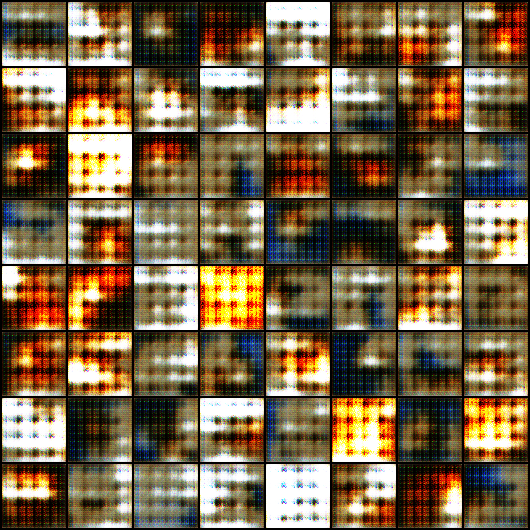

In [90]:
Image('./generated/generated-images-0013.png')

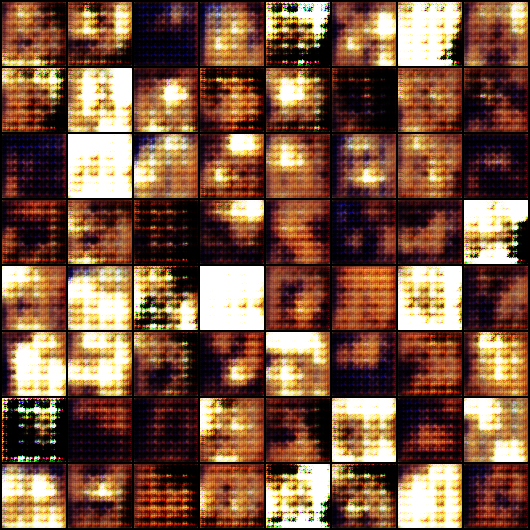

In [91]:
Image('./generated/generated-images-0037.png')

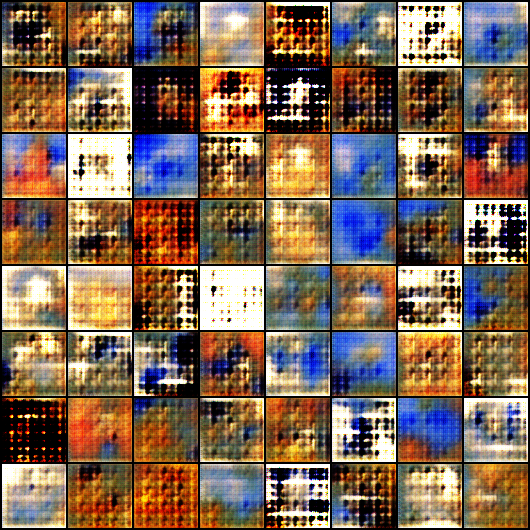

In [92]:
Image('./generated/generated-images-0072.png')

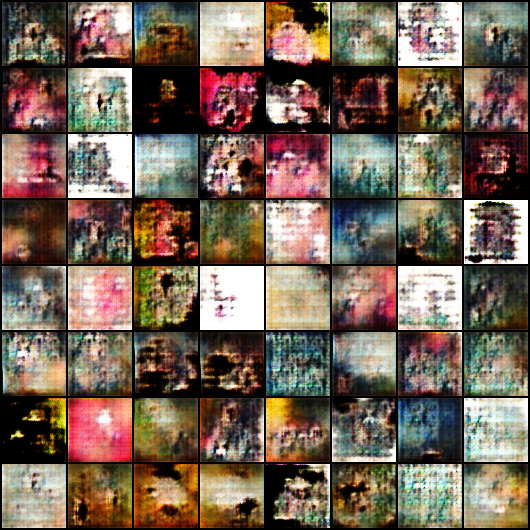

In [93]:
Image('./generated/generated-images-0103.png')

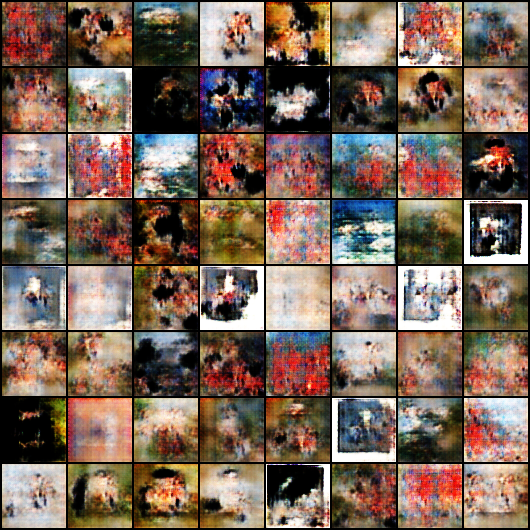

In [94]:
Image('./generated/generated-images-0138.png')

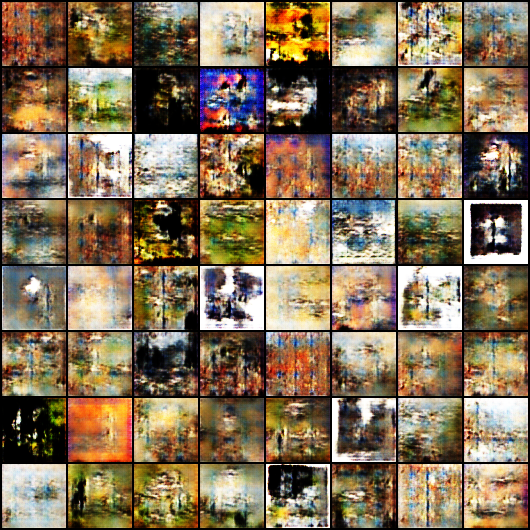

In [95]:
Image('./generated/generated-images-0147.png')

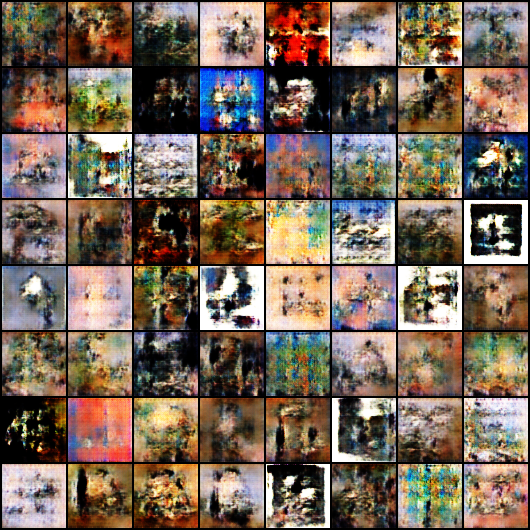

In [96]:
Image('./generated/generated-images-0150.png')

In [98]:
losses_g, losses_d, real_scores, fake_scores = history

In [99]:
# Get the metrics
loss_g = losses_g[-1]
loss_d = losses_d[-1]
real_score = real_scores[-1]
fake_score = fake_scores[-1]

# Print the metrics
print(f'Loss G: {loss_g}, Loss D: {loss_d}, Real Score: {real_score}, Fake Score: {fake_score}')

# Optionally, write the metrics to a file
with open('metrics.txt', 'w') as f:
    f.write(f'Loss G: {loss_g}\n')
    f.write(f'Loss D: {loss_d}\n')
    f.write(f'Real Score: {real_score}\n')
    f.write(f'Fake Score: {fake_score}\n')

Loss G: 4.608015537261963, Loss D: 0.3230257034301758, Real Score: 0.8277178406715393, Fake Score: 0.06450189650058746


In [101]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

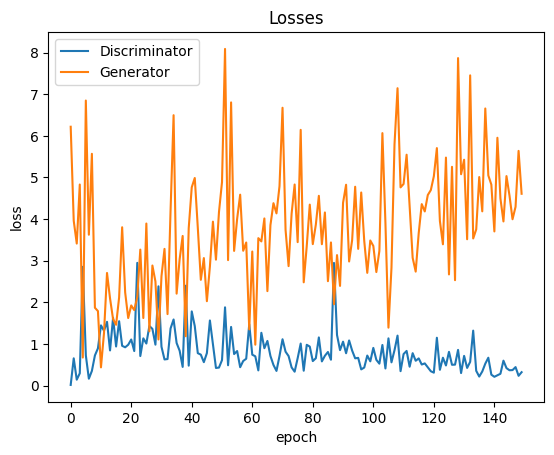

In [102]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

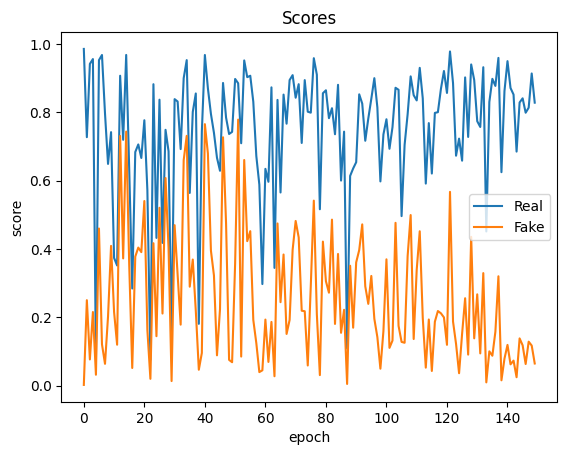

In [103]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [106]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname, cv2.VideoWriter_fourcc(*'DIVX'), 1, (530, 530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()